In [1]:
import pandas as pd
import numpy as np

URL = "https://data.ademe.fr/data-fair/api/v1/datasets/igt-pouvoir-de-rechauffement-global/full"
FILE  = "_data_cache/igt_ademe_2016.csv"

# df = pd.read_csv(URL)
df = pd.read_csv(FILE)
df.head()

,INSEE commune,Commune,Agriculture,Autres transports,Autres transports international,CO2 biomasse hors-total,Déchets,Energie,Industrie hors-énergie,Résidentiel,Routier,Tertiaire,lat,lon
0,01001,L'ABERGEMENT-CLEMENCIAT,3711.425991,NaN,NaN,432.751835,101.430476,2.354558,6.911213,309.358195,793.156501,367.036172,46.150598,4.920347
1,01002,L'ABERGEMENT-DE-VAREY,475.330205,NaN,NaN,140.741660,140.675439,2.354558,6.911213,104.866444,348.997893,112.934207,46.006742,5.423379
2,01004,AMBERIEU-EN-BUGEY,499.043526,212.577909,NaN,10313.446520,5314.314445,998.332482,2930.354461,16616.822530,15642.420310,10732.376930,45.957700,5.356635
3,01005,AMBERIEUX-EN-DOMBES,1859.160954,NaN,NaN,1144.429311,216.217508,94.182310,276.448534,663.683146,1756.341319,782.404357,45.997777,4.902089
4,01006,AMBLEON,448.966808,NaN,NaN,77.033834,48.401549,NaN,NaN,43.714019,398.786800,51.681756,45.748721,5.601236


In [2]:
df

,INSEE commune,Commune,Agriculture,Autres transports,Autres transports international,CO2 biomasse hors-total,Déchets,Energie,Industrie hors-énergie,Résidentiel,Routier,Tertiaire,lat,lon
0,01001,L'ABERGEMENT-CLEMENCIAT,3711.425991,NaN,NaN,432.751835,101.430476,2.354558,6.911213,309.358195,793.156501,367.036172,46.150598,4.920347
1,01002,L'ABERGEMENT-DE-VAREY,475.330205,NaN,NaN,140.741660,140.675439,2.354558,6.911213,104.866444,348.997893,112.934207,46.006742,5.423379
2,01004,AMBERIEU-EN-BUGEY,499.043526,212.577909,NaN,10313.446520,5314.314445,998.332482,2930.354461,16616.822530,15642.420310,10732.376930,45.957700,5.356635
3,01005,AMBERIEUX-EN-DOMBES,1859.160954,NaN,NaN,1144.429311,216.217508,94.182310,276.448534,663.683146,1756.341319,782.404357,45.997777,4.902089
4,01006,AMBLEON,448.966808,NaN,NaN,77.033834,48.401549,NaN,NaN,43.714019,398.786800,51.681756,45.748721,5.601236
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35793,95676,VILLERS-EN-ARTHIES,1628.065094,NaN,NaN,165.045396,65.063617,11.772789,34.556067,176.098160,309.627908,235.439109,49.088675,1.725421
35794,95678,VILLIERS-ADAM,698.630772,NaN,NaN,1331.126598,111.480954,2.354558,6.911213,1395.529811,18759.370070,403.404815,49.064224,2.235087
35795,95680,VILLIERS-LE-BEL,107.564967,NaN,NaN,8367.174532,225.622903,534.484607,1568.845431,22613.830250,12217.122400,13849.512000,49.008456,2.389003
35796,95682,VILLIERS-LE-SEC,1090.890170,NaN,NaN,326.748418,108.969749,2.354558,6.911213,67.235487,4663.232127,85.657725,49.072295,2.388251


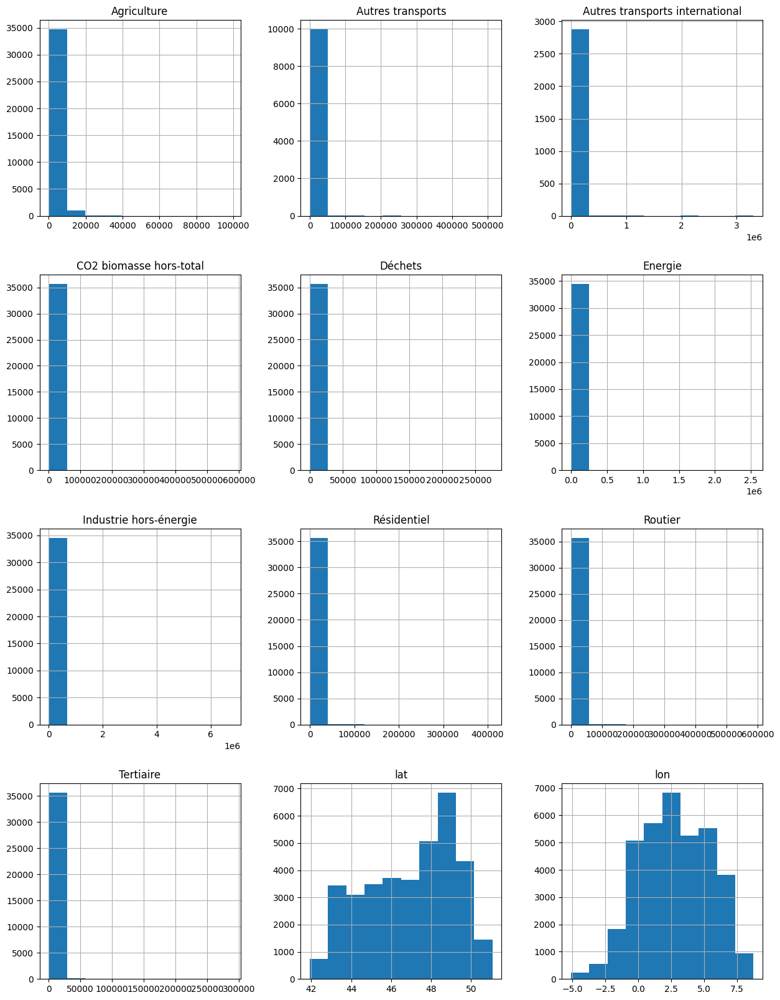

In [3]:
hist = df.hist(bins=10, figsize=(15,20))

In [4]:
df_agri = df.dropna(subset=['Agriculture']).copy()
df_agri['txt'] = df_agri['Commune']+" : " + df_agri["Agriculture"].astype('str')
colorbar_title = "Agriculture"
df_agri["sum"] = df_agri["Agriculture"]
agri_split = 1500
df_agri_small = df_agri[df_agri['Agriculture'] <agri_split]
df_agri_big = df_agri[df_agri['Agriculture'] >=agri_split]
geo_layout = dict(
        scope = 'europe',
        showland = True,
        landcolor = "rgb(212, 212, 212)",
        subunitcolor = "rgb(255, 255, 255)",
        countrycolor = "rgb(255, 255, 255)",
        showlakes = True,
        lakecolor = "rgb(255, 255, 255)",
        showsubunits = True,
        showcountries = True,
        resolution = 50,
        #projection = dict(
        #    type = 'conic conformal',
        #    rotation_lon = -100
        #),
        )

In [5]:
df_agri_small['Agriculture'].describe()

count    17279.000000
mean       770.141797
std        409.656486
min          0.003432
25%        453.979136
50%        776.335006
75%       1110.439126
max       1499.867670
Name: Agriculture, dtype: float64

In [6]:
df_agri_big['Agriculture'].describe()

count    18457.000000
mean      4041.957720
std       3354.768324
min       1500.089699
25%       2059.536969
50%       2938.074488
75%       4690.337692
max      98949.317760
Name: Agriculture, dtype: float64

In [7]:
from plotly import graph_objects as go
fig  = go.Figure(data=go.Scattergeo(
    locationmode = "ISO-3",
    lat=df_agri_small['lat'],
    lon=df_agri_small['lon'],
    text=df_agri_small['txt'],
    mode = 'markers',
    marker=dict(      
        size=8,
        cmin=0,
        cmax=df_agri_small["sum"].max(),
        color=df_agri_small["sum"],
        colorbar_title=colorbar_title,
    ),

    )
)
fig.update_layout(
    autosize=False,
    width=1600,
    height=800,
    geo = geo_layout
)
fig.update_geos(
    lataxis_range=[df['lat'].min(),df["lat"].max()], 
    lonaxis_range=[df['lon'].min(), df["lon"].max()])

fig.show()

In [8]:
from plotly import graph_objects as go
fig  = go.Figure(data=go.Scattergeo(
    locationmode = "ISO-3",
    lat=df_agri_big['lat'],
    lon=df_agri_big['lon'],
    text=df_agri_big['txt'],
    mode = 'markers',
    marker=dict(      
        size=8,
        cmin=0,
        cmax=df_agri_big["sum"].max(),
        color=df_agri_big["sum"],
        colorbar_title=colorbar_title,
    ),

    )
)

fig.update_layout(
    autosize=False,
    width=1600,
    height=800,
    geo = geo_layout
)
fig.update_geos(
    lataxis_range=[df['lat'].min(),df["lat"].max()], 
    lonaxis_range=[df['lon'].min(), df["lon"].max()])
fig.show()

In [9]:
COBAN=[
    'MIOS',
    'MARCHEPRIME',
    'BIGANOS',
    'AUDENGE',
    'LANTON',
    'ANDERNOS-LES-BAINS',
    'ARES',
    'LEGE-CAP-FERRET',]

VAL_DE_L_EYRE = [
    'BELIN-BELIET',
    'LE BARP',
    'LUGOS',
    'SAINT-MAGNE',
    'SALLES',]

COBAS = [
    'ARCACHON',
    'GUJAN-MESTRAS',
    'LA TESTE-DE-BUCH',
    'LE TEICH']

SYBARVAL = COBAN + COBAS + VAL_DE_L_EYRE

all_cols = [
    "Autres transports",
    "Routier",
    "Autres transports international",
    "Agriculture",
    "CO2 biomasse hors-total",
    "Déchets",
    "Energie",
    "Industrie hors-énergie",
    "Résidentiel",
    "Tertiaire",
]



all_cols = [
    "Autres transports",
    "Routier",
    "Autres transports international",
    "Agriculture",
    "CO2 biomasse hors-total",
    "Déchets",
    "Energie",
    "Industrie hors-énergie",
    "Résidentiel",
    "Tertiaire",
]


transport_cols = [
    "Autres transports",
    "Routier",
    "Autres transports international",]




In [10]:
syberval_df = df[df["Commune"].isin(SYBARVAL) & df["INSEE commune"].str.startswith("33")]
syberval_df

,INSEE commune,Commune,Agriculture,Autres transports,Autres transports international,CO2 biomasse hors-total,Déchets,Energie,Industrie hors-énergie,Résidentiel,Routier,Tertiaire,lat,lon
12672,33005,ANDERNOS-LES-BAINS,246.335648,NaN,NaN,8248.644104,95.620427,277.837813,815.523175,15031.423140,13008.128700,6399.686262,44.742448,-1.090931
12676,33009,ARCACHON,208.823953,42.189423,NaN,10071.084650,86.541649,979.496020,2875.064754,24975.550790,18275.984070,5689.672379,44.658380,-1.169450
12678,33011,ARES,236.385326,NaN,NaN,3982.604467,47.963041,61.218501,179.691547,5852.954789,7863.067248,2778.372903,44.764183,-1.136804
12686,33019,AUDENGE,3117.438503,1.489062,NaN,4691.340173,7349.622715,68.282174,200.425187,5935.578784,7365.755394,4858.354272,44.683088,-1.013330
12696,33029,LE BARP,1941.054472,NaN,NaN,17259.297730,42.279511,240.164890,20903.972260,3388.822983,10806.034260,7045.431811,44.606091,-0.768121
12708,33042,BELIN-BELIET,1643.429836,NaN,NaN,5397.258536,39.900360,235.455774,691.121335,3601.604246,25708.844490,2896.220268,44.497153,-0.791073
12717,33051,BIGANOS,347.953450,227.687953,NaN,11574.755710,82.196393,1791.818441,44041.312020,8685.704595,16019.853210,7768.795140,44.643766,-0.978962
12864,33199,GUJAN-MESTRAS,691.567977,133.971481,NaN,14623.139390,167.647598,751.103919,2204.677059,19398.463120,13474.640230,11400.296050,44.635116,-1.067986
12893,33229,LANTON,2632.416240,NaN,NaN,5185.745722,54.266141,49.445713,145.135480,6632.953129,19589.844990,4566.840084,44.702988,-1.036237
12900,33236,LEGE-CAP-FERRET,318.430528,244.126403,NaN,6796.268309,66.963212,282.546929,829.345602,10556.882640,20100.055920,5029.653920,44.792671,-1.146498


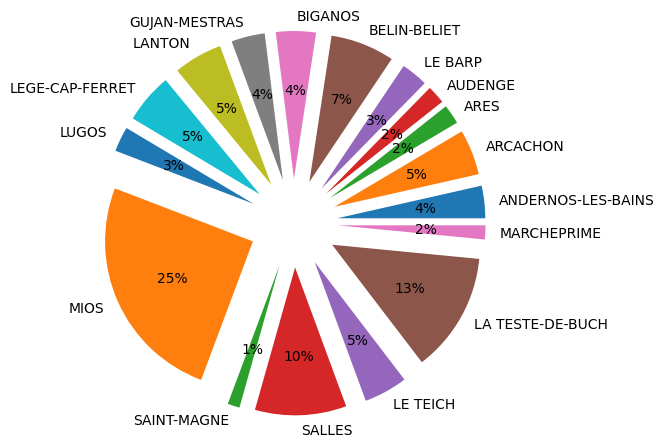

In [11]:
import matplotlib.pyplot as plt

# declaring exploding pie
explode = [0.3 for n in syberval_df["Commune"]]
plt.pie(syberval_df["Routier"], labels=syberval_df["Commune"],autopct='%.0f%%', explode=explode)
plt.show()

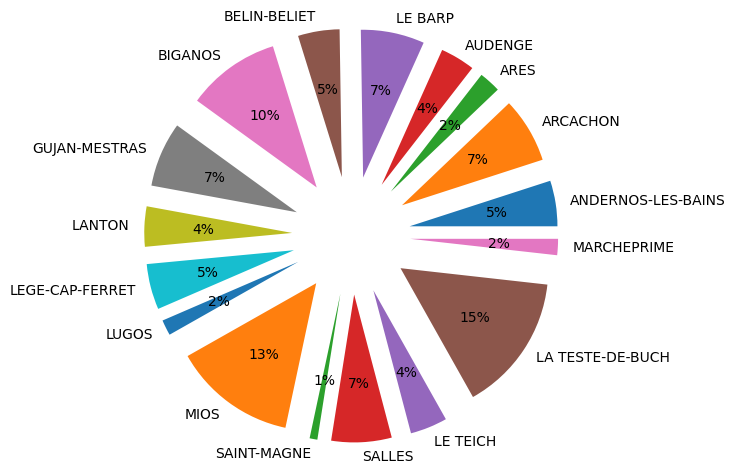

In [12]:
import matplotlib.pyplot as plt

# declaring exploding pie
explode = [0.4 for n in syberval_df["Commune"]]
plt.pie(syberval_df[all_cols].sum(axis=1), labels=syberval_df["Commune"],autopct='%.0f%%', explode=explode)
plt.show()

In [13]:
syberval_df[transport_cols].fillna(0).agg("sum")

Autres transports                    2369.218552
Routier                            367351.737962
Autres transports international         0.000000
dtype: float64

In [14]:
all = syberval_df[all_cols].fillna(0).agg("sum").sum()
print(f"{all=}")

transport = syberval_df[transport_cols].fillna(0).agg("sum").sum()
print(f"{transport=}")

transport_percent = transport/all
print(f"{transport_percent=}")

all=885456.21164206
transport=369720.956513958
transport_percent=0.41754854915786094
